In [66]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import graphviz
import subprocess
from sklearn import datasets, tree
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, recall_score, make_scorer, plot_roc_curve, roc_curve, auc
from sklearn.preprocessing import LabelEncoder
from os import system
from IPython.display import Image

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Read the csv file from the local machine

In [4]:
df = pd.read_csv("adult-dataset.csv")
df.head()
df

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class-label
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


# Pre-processing data
We find out that many instances contain a question mark (missing data). Then, we decided to remove this data from our analysis

In [5]:
df = df.replace({' ?': np.nan})
df.dropna(how='any',inplace = True)
df

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class-label
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


# Univariate analysis 

<AxesSubplot:>

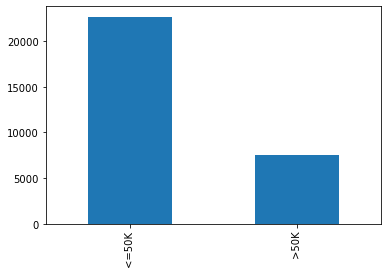

In [6]:
df['class-label'].value_counts().plot(kind = "bar")


array([[<AxesSubplot:title={'center':'age'}>]], dtype=object)

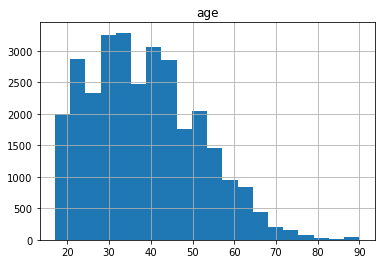

In [7]:
df.hist(column = "age",bins = 20)


<AxesSubplot:>

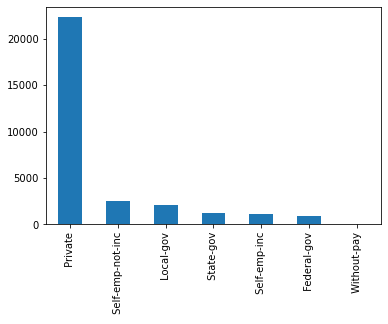

In [8]:
df['workclass'].value_counts().plot(kind = "bar")

<AxesSubplot:>

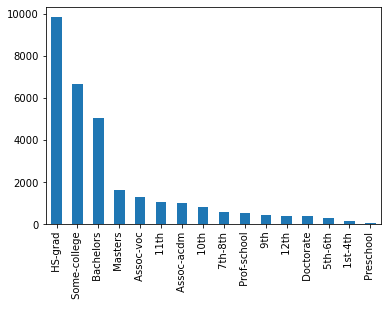

In [9]:
df['education'].value_counts().plot(kind = "bar")

<AxesSubplot:>

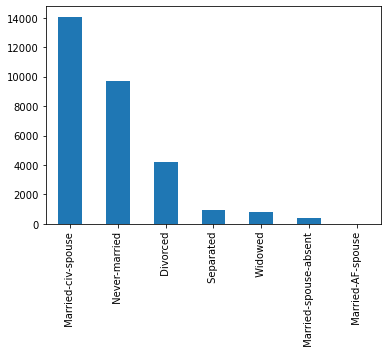

In [10]:
df['marital-status'].value_counts().plot(kind = "bar")

<AxesSubplot:>

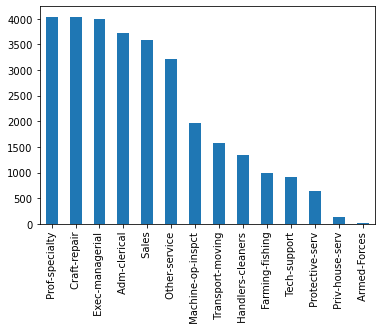

In [11]:
df['occupation'].value_counts().plot(kind = "bar")

<AxesSubplot:>

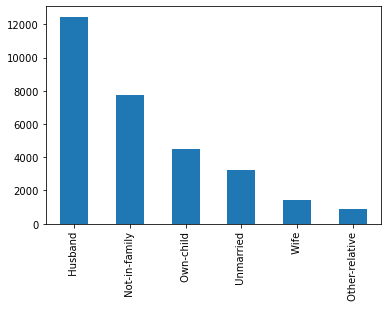

In [12]:
df['relationship'].value_counts().plot(kind = "bar")

<AxesSubplot:>

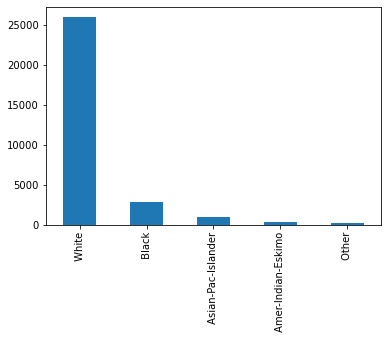

In [13]:
df['race'].value_counts().plot(kind = "bar")

<AxesSubplot:>

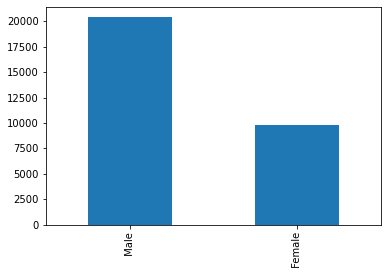

In [14]:
df['sex'].value_counts().plot(kind = "bar")

Because the capital-loss and capital-gain are numeric (most of them distributed in a wide range), we decided to normalize the data. 

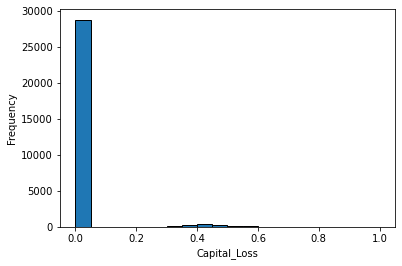

In [15]:
df["capital-loss"]=((df["capital-loss"]-df["capital-loss"].min())/(df["capital-loss"].max()-df["capital-loss"].min()))
bins= [0, 0.05, 0.1, 0.15, 0.25, 0.3, 0.35, 0.40, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1]
plt.hist(df["capital-loss"], bins=bins, edgecolor="k")
plt.xlabel('Capital_Loss')
plt.ylabel('Frequency')
plt.show()

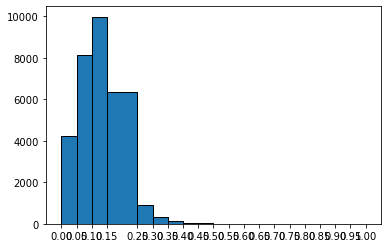

In [16]:
df["fnlwgt"]=((df["fnlwgt"]-df["fnlwgt"].min())/(df["fnlwgt"].max()-df["fnlwgt"].min()))

bins= [0, 0.05, 0.1, 0.15, 0.25, 0.3, 0.35, 0.40, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1]
plt.hist(df["fnlwgt"], bins=bins, edgecolor="k")
plt.xticks(bins)
plt.show()

<AxesSubplot:>

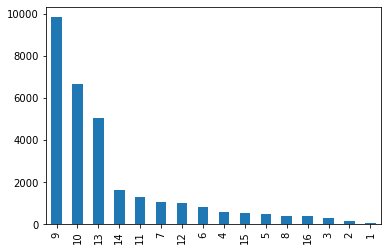

In [17]:
df['education-num'].value_counts().plot(kind = "bar")


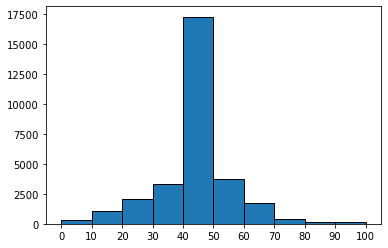

In [18]:
bins= [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
plt.hist(df["hours-per-week"], bins=bins, edgecolor="k")
plt.xticks(bins)
plt.show()




<AxesSubplot:>

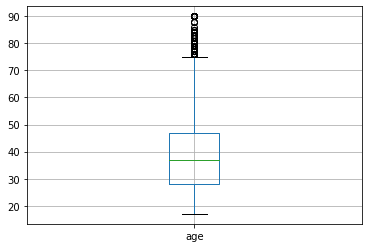

In [19]:
df.boxplot(column=['age'])

<AxesSubplot:>

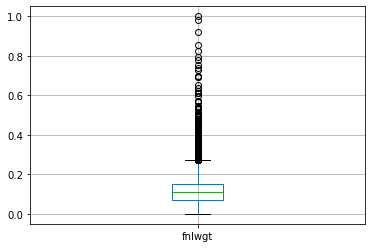

In [20]:
df.boxplot(column=['fnlwgt'])

<AxesSubplot:>

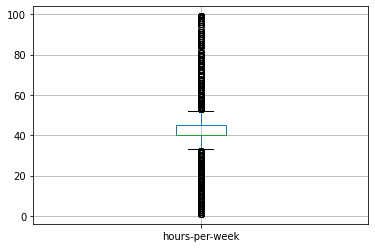

In [21]:
df.boxplot(column=['hours-per-week'])

# Bivariate analysis

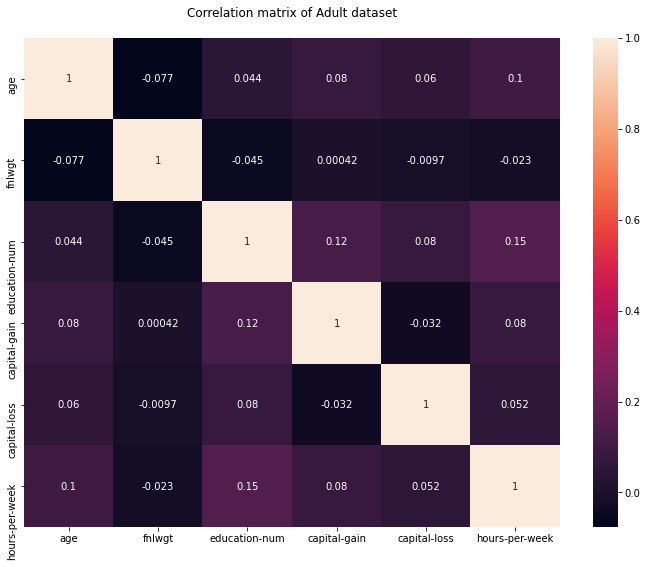

In [22]:

plt.figure(figsize=(12, 9))

hm = sns.heatmap(df.corr(), annot = True)

hm.set(title = "Correlation matrix of Adult dataset\n")

plt.show()

# 3.1 Feature Selection

In this model, we used numerical data for clustring and categorical data for evaluation

In [23]:
df_new = df.drop(labels=["education", "education-num", "marital-status", "occupation", "relationship", "race","sex","workclass","capital-loss","native-country","capital-gain","hours-per-week"],axis=1)
df_new

,age,fnlwgt,class-label
0,39,0.043338,<=50K
1,50,0.047277,<=50K
2,38,0.137244,<=50K
3,53,0.150212,<=50K
4,28,0.220703,<=50K
...,...,...,...
32556,27,0.165563,<=50K
32557,40,0.095589,>50K
32558,58,0.093914,<=50K
32559,22,0.127620,<=50K


In [24]:
df_bin = pd.get_dummies(df["class-label"])
# Convert class-label to bin
df_new["class-label"]=df_bin.iloc[:,1]
df_new

,age,fnlwgt,class-label
0,39,0.043338,0
1,50,0.047277,0
2,38,0.137244,0
3,53,0.150212,0
4,28,0.220703,0
...,...,...,...
32556,27,0.165563,0
32557,40,0.095589,1
32558,58,0.093914,0
32559,22,0.127620,0


In [25]:

# Specify Train data
x_train = df_new.iloc[:,0:2]
y_train = df_new.iloc[:,2]
x_train



,age,fnlwgt
0,39,0.043338
1,50,0.047277
2,38,0.137244
3,53,0.150212
4,28,0.220703
...,...,...
32556,27,0.165563
32557,40,0.095589
32558,58,0.093914
32559,22,0.127620


## 3.2.1 KMeans Algorithm

### 3.2.1.1 Parameter Tuning

Defining proper number of clusters

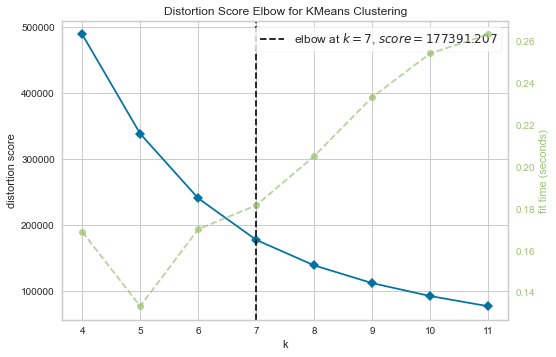

The is optimal value of k:


7

In [26]:
from sklearn import cluster
from yellowbrick.cluster import SilhouetteVisualizer, KElbowVisualizer, InterclusterDistance

model = cluster.KMeans()
visualizer = KElbowVisualizer(model, k=(4,12))
visualizer.fit(x_train)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure


print ('The is optimal value of k:')
visualizer.elbow_value_


### 3.2.1.2 Evaluation measures

##### 3.2.1.2.1 Internal measures

Plot Silhouette score

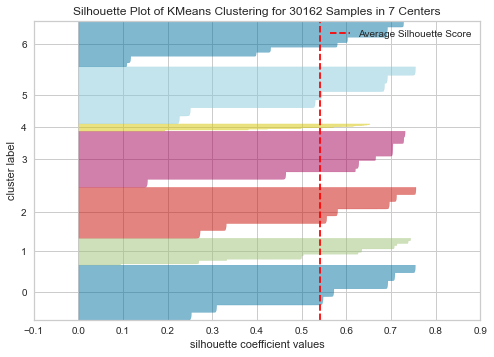

Average silhouette score is:


0.5414544097021421

In [27]:
model = cluster.KMeans(7, random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(x_train)        # Fit the data to the visualizer
visualizer.show()              # Finalize and render the figure
print ("Average silhouette score is:")
visualizer.silhouette_score_

#### 3.2.1.2.2 External measures

Purity and Entrophy

In [145]:
#Entrophy and purity:
from math import log
#class1_pr = np.count_nonzero(y_train.to_numpy())/len(y_train)
#class2_pr = 1-class1_pr

# prob[cluster_no][class]
def compute_entrophy_purity(label, x_train, y_train, no_clusters):
    x_train = x_train.to_numpy()
    y_train = y_train.to_numpy()
    prob = [[0,0] for _ in range(no_clusters)]
    lab_count = [0 for _ in range(no_clusters)]
    entrophy = [0 for _ in range(no_clusters)]
    purity = [0 for _ in range(no_clusters)]
    for i in range(len(x_train)):
        #compute probabilites p_ij of observing class j in cluster i
        #print(i, label[i], y_train[i])
        prob[label[i]][y_train[i]] += 1
        lab_count[label[i]] += 1
    for i in range(no_clusters):
        for j in [0,1]:
            prob[i][j] /= lab_count[i]
    ent_of_clustering = 0
    for i in range(no_clusters):
        #compute enthropies of clusters
        print(prob[i][0], prob[i][1])
        entrophy[i] = -(prob[i][0]*log(prob[i][0], 2) + prob[i][1]*log(prob[i][1], 2))
        #compute purities of cluster
        purity[i] = max(prob[i][0], prob[i][1])
        # ethropy of clustering
        ent_of_clustering += entrophy[i]*lab_count[i]/len(x_train)
        # purity of clustering
        purity_of_clustering = purity[i]*lab_count[i]/len(x_train)
    return ent_of_clustering, purity_of_clustering
eoc, poc = compute_entrophy_purity(model.labels_, x_train, y_train, 7)
print("Purity:\n",poc)
print("Entrophy:\n",eoc)

0.8360567426827078 0.16394325731729215
0.6803248431155408 0.3196751568844592
0.6298890834792761 0.37011091652072386
0.9804163726182075 0.01958362738179252
0.7818930041152263 0.21810699588477367
0.7026745397707538 0.2973254602292463
0.5980392156862745 0.4019607843137255
Purity:
 0.09100855380942909
Entrophy:
 0.7219981014793845


#### 3.2.1.2.3 Discriminative behavior

<AxesSubplot:xlabel='cluster', ylabel='count'>

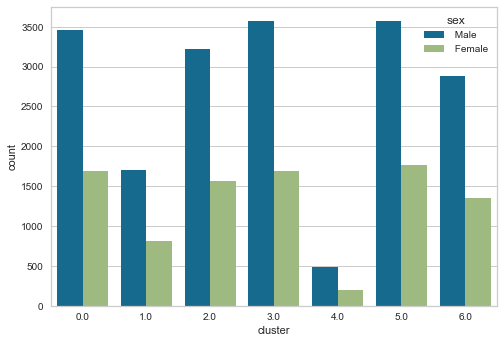

In [147]:
# frequency of "Sex" feature in different cluster
plot_help = x_train
plot_help["cluster"] = pd.DataFrame(model.labels_ , columns=["cluster"])
plot_help["race"] = df["race"]
plot_help["sex"] = df["sex"]
sns.countplot(x = "cluster", hue="sex", data=plot_help)


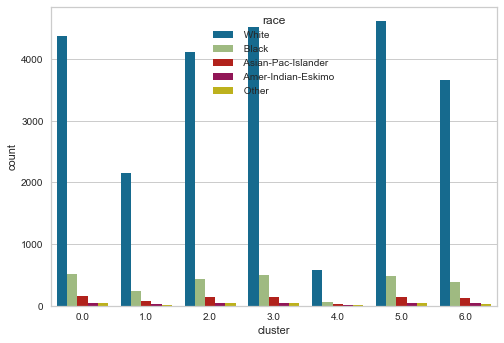

In [148]:
# frequency of "race" feature in different cluster

sns.countplot(x = "cluster", hue="race", data=plot_help)
x_train = x_train.iloc[:,0:2]

This section is time consumming

In [ ]:
DD

### Trying to remove outliers

0.829984591080281


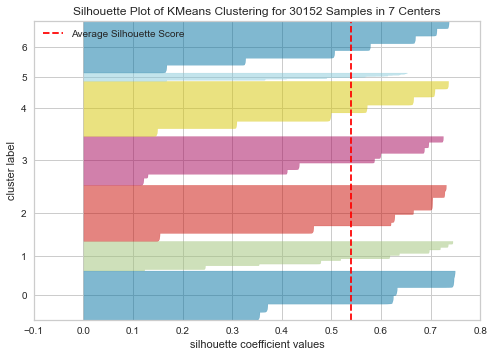

Average silhouette score is:


0.5394028401958887

In [ ]:
import numpy as np
from sklearn.neighbors import LocalOutlierFactor
clf = LocalOutlierFactor(n_neighbors=7)
threshold_LOF = 10
clf.fit_predict(x_train)
large_values = abs(clf.negative_outlier_factor_)
print (large_values.min())
x_train_num = x_train.to_numpy()
large_values = (large_values  > threshold_LOF).reshape(len(large_values ),1)
large_values = np.hstack((large_values,large_values))
x_train_num[large_values]=-9999
x_train_num
row_mask = (x_train_num != -9999).all(axis=1)
new_x_train = x_train_num[row_mask,:]

model = cluster.KMeans(7, random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(new_x_train)        # Fit the data to the visualizer
visualizer.show()              # Finalize and render the figure
print ("Average silhouette score is:")
visualizer.silhouette_score_

### 3.2.1.3 Model interpretability/visualization

Dimension reduction

In [ ]:
from sklearn.manifold import MDS
from matplotlib import pyplot as plt
import sklearn.datasets as dt
import seaborn as sns         
import numpy as np
from sklearn.metrics.pairwise import manhattan_distances, euclidean_distances
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# Reduce the dimention

x_train_num = x_train.to_numpy()
dist = manhattan_distances(x_train_num[0:5000])
mds = MDS(dissimilarity='precomputed', random_state=0)
# Get the embeddings
x_train_num_L1 = mds.fit_transform(dist)



<AxesSubplot:xlabel='dim_1', ylabel='dim_2'>

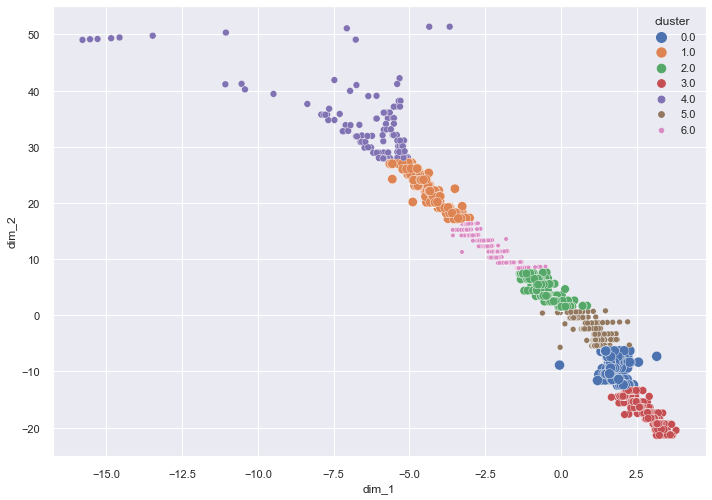

In [ ]:
kmeans = cluster.KMeans(7, random_state=42).fit(x_train)
data = np.expand_dims(kmeans.labels_[0:5000], axis=1)
data = np.append(x_train_num_L1, data, axis=1)
df_vis_dts = pd. DataFrame(data, columns=['dim_1', 'dim_2', 'cluster'])
sns.set(rc={'figure.figsize':(11.7,8.27)})

sns.scatterplot(data=df_vis_dts , x="dim_1", y="dim_2", hue="cluster", size="cluster", palette="deep", sizes=(100, 20), legend="full")

In [ ]:
print(kmeans)

KMeans(n_clusters=7, random_state=42)


## 3.2.2 KMedoids Algorithm

### 3.2.2.1 Parameter Tuning

C:\ProgramData\Anaconda3\lib\site-packages\sklearn_extra\cluster\_k_medoids.py:275: UserWarning: Cluster 5 is empty! self.labels_[self.medoid_indices_[5]] may not be labeled with its corresponding cluster (5).
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn_extra\cluster\_k_medoids.py:275: UserWarning: Cluster 5 is empty! self.labels_[self.medoid_indices_[5]] may not be labeled with its corresponding cluster (5).
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn_extra\cluster\_k_medoids.py:275: UserWarning: Cluster 6 is empty! self.labels_[self.medoid_indices_[6]] may not be labeled with its corresponding cluster (6).
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn_extra\cluster\_k_medoids.py:275: UserWarning: Cluster 3 is empty! self.labels_[self.medoid_indices_[3]] may not be labeled with its corresponding cluster (3).
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn_extra\cluster\_k_medoids.py:275: UserWarn

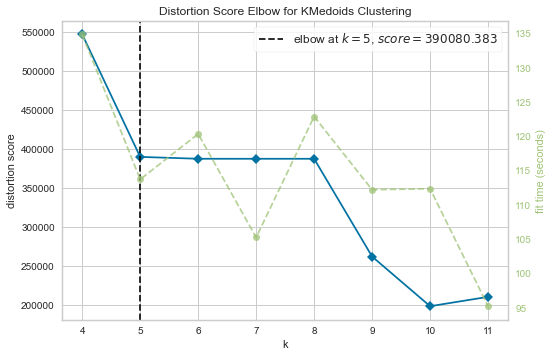

The is optimal value of k:


5

In [ ]:
from sklearn import cluster
from sklearn_extra import cluster

from yellowbrick.cluster import SilhouetteVisualizer, KElbowVisualizer, InterclusterDistance

model = cluster.KMedoids()
visualizer = KElbowVisualizer(model, k=(4,12))
visualizer.fit(x_train)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure


print ('The is optimal value of k:')
visualizer.elbow_value_

### 3.2.2.2 Evaluation measures

##### 3.2.2.2.1 Internal measures

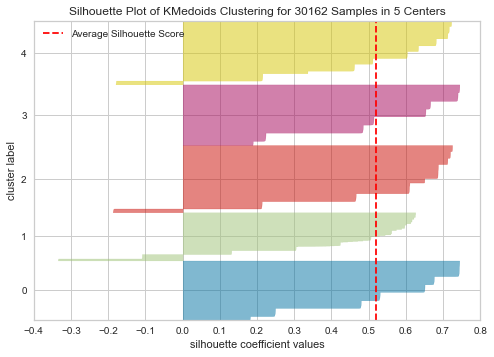

Average silhouette score is:


0.5205059532780824

In [149]:
from sklearn_extra import cluster

model = cluster.KMedoids(5, random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(x_train)        # Fit the data to the visualizer
visualizer.show()              # Finalize and render the figure
print ("Average silhouette score is:")
visualizer.silhouette_score_

#### 3.2.2.2.2 External measures

In [150]:
eoc, poc = compute_entrophy_purity(model.labels_, x_train, y_train, 5)
print("Purity:",poc)
print("Entrophy:",eoc)

0.6732408490723717 0.3267591509276283
0.6748971193415638 0.32510288065843623
0.9689248895434462 0.031075110456553756
0.798202614379085 0.20179738562091504
0.605710719300983 0.39428928069901703
Purity: 0.12870499303759697
Entrophy: 0.725186164638784


#### 3.2.2.2.3 Discriminative behavior

<AxesSubplot:xlabel='cluster', ylabel='count'>

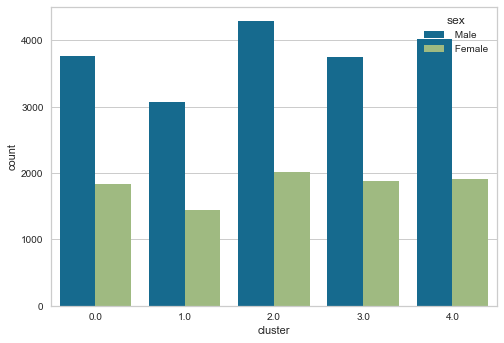

In [151]:
# frequency of "Sex" feature in different cluster
plot_help = x_train
plot_help["cluster"] = pd.DataFrame(model.labels_ , columns=["cluster"])
plot_help["race"] = df["race"]
plot_help["sex"] = df["sex"]
sns.countplot(x = "cluster", hue="sex", data=plot_help)

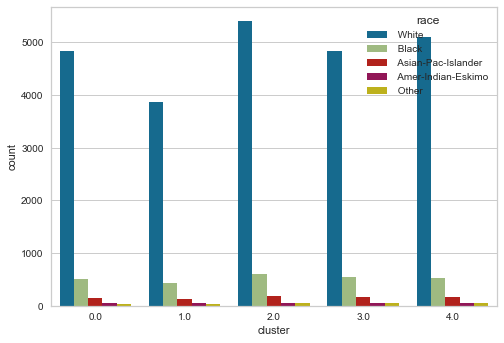

In [152]:
# frequency of "race" feature in different cluster
sns.countplot(x = "cluster", hue="race", data=plot_help)
x_train = x_train.iloc[:,0:2]

### 3.2.2.3 Model interpretability/visualization

<AxesSubplot:xlabel='dim_1', ylabel='dim_2'>

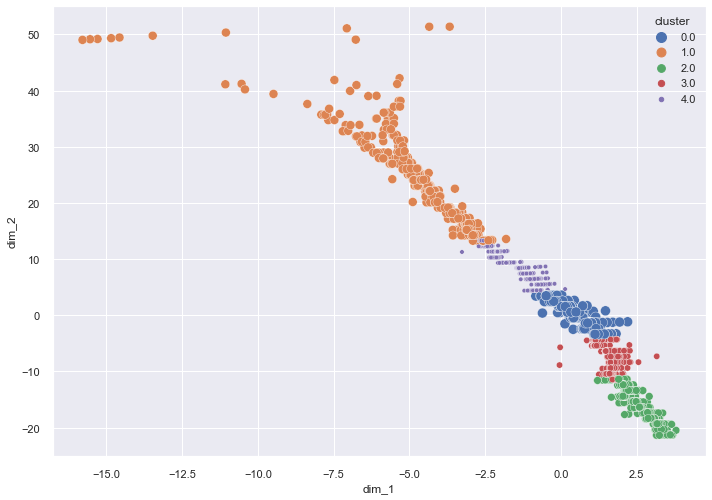

In [ ]:
from sklearn import cluster
from sklearn_extra import cluster

from yellowbrick.cluster import SilhouetteVisualizer, KElbowVisualizer, InterclusterDistance



kmedoids = cluster.KMedoids(5, random_state=42).fit(x_train)
data_medo = np.expand_dims(kmedoids.labels_[0:5000], axis=1)
data_medo = np.append(x_train_num_L1, data_medo, axis=1)
df_vis_dts = pd. DataFrame(data_medo, columns=['dim_1', 'dim_2', 'cluster'])
sns.set(rc={'figure.figsize':(11.7,8.27)})

sns.scatterplot(data=df_vis_dts , x="dim_1", y="dim_2", hue="cluster", size="cluster", palette="deep", sizes=(100, 20), legend="full")

## 3.2.3 DBSCAN Algorithm

## 3.2.3.1 Parameter Tuning

In [29]:
from sklearn import cluster
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import graphviz
import subprocess
from sklearn import datasets, tree
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, recall_score, make_scorer, plot_roc_curve, roc_curve, auc
from sklearn.preprocessing import LabelEncoder
from os import system
from IPython.display import Image
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import graphviz
import subprocess
from sklearn import datasets, tree
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, recall_score, make_scorer, plot_roc_curve, roc_curve, auc
from sklearn.preprocessing import LabelEncoder
from os import system
from IPython.display import Image
from sklearn.neighbors import NearestNeighbors
%matplotlib widget
%matplotlib inline
%matplotlib inline
import mpld3
mpld3.enable_notebook()
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import sklearn.metrics as metrics
from sklearn import cluster 
from yellowbrick.cluster import SilhouetteVisualizer
from pylab import rcParams
from plotnine import *
from sklearn.mixture import GaussianMixture
import pandas as pd

In [52]:
df_new = df.drop(labels=["education","class-label", "education-num", "marital-status", "occupation", "relationship", "race","sex","workclass","capital-loss","native-country","capital-gain","hours-per-week"],axis=1)
df_new

,age,fnlwgt
0,39,0.043338
1,50,0.047277
2,38,0.137244
3,53,0.150212
4,28,0.220703
...,...,...
32556,27,0.165563
32557,40,0.095589
32558,58,0.093914
32559,22,0.127620


### 3.2.3.1.1 Determining the epsilon value 

Text(0, 0.5, 'epsilon value')

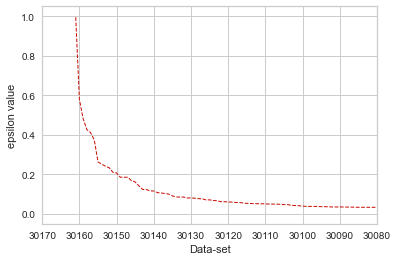

In [53]:
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(n_neighbors=30)
neighbors_fit = neighbors.fit(x_train)
distances, indices = neighbors_fit.kneighbors(x_train)
#Step 3: Sort distance values by ascending value and plot

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances, color='r', linestyle='dashed',
     linewidth=1)

plt.xlim([30080, 30170])
plt.gca().invert_xaxis()
plt.xlabel("Data-set")
plt.ylabel("epsilon value")

### 3.2.3.1.2 Determing the optimal minimum sample

In [55]:
silhouette = [] 
itr = []
for i in range (40,800,20):
    db = cluster.DBSCAN ( eps = 0.5, min_samples = i ).fit(x_train)
    labels = db.labels_
    silhouette_score = metrics.silhouette_score(x_train, labels)
    itr.append(i)
    silhouette.append(silhouette_score)

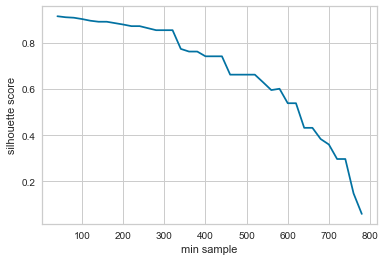

In [56]:
plt.plot(itr, silhouette)
plt.xlabel("min sample")
plt.ylabel("silhouette score")
plt.savefig("Silhouette Score vs Min Sample")

## 3.2.3.2 DBSCAN implementation

### 3.2.3.2.1 DBSCAN modelling

In [63]:
db = DBSCAN ( eps = 0.5 , min_samples = 300).fit(df_new)

labsList = ["Noise"]
labsList = labsList + ["cluster" + str(i) for i in range (1,len(set(db.labels_)))]

df_new["assignments"] = db.labels_

### 3.2.3.2.2 DBSCAN visualization

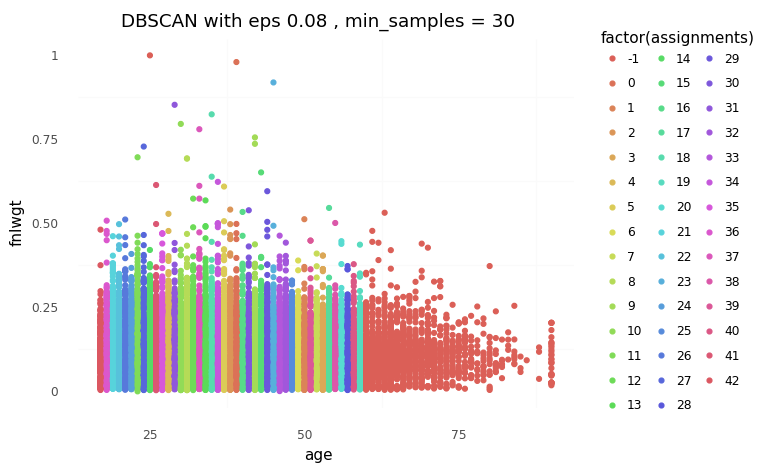

<ggplot: (8762060171749)>

In [65]:
(ggplot(df_new,aes(x="age",y = "fnlwgt", color = "factor(assignments)"))+geom_point()+ theme_minimal()+ 
theme(panel_grid_major = element_blank())+
labs(title = "DBSCAN with eps 0.08 , min_samples = 30"))

## 3.2.3.3 Results

In [60]:
d1_clustered = df_new.loc[(df_new.assignments >= 0)]
labels = db.labels_
#silhouette_score(d1_clustered[["age","fnlwgt"]],d1_clustered[["assignments"]])
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(df_new, labels))

Estimated number of clusters: 43
Estimated number of noise points: 2083
Silhouette Coefficient: 0.942
